# Data import & Preprocessing

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn as skl

In [2]:
data =pd.read_csv('Makine verileri.csv')
data.head()

,machineID,datetime,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,...,error3count,error4count,error5count,comp1,comp2,comp3,comp4,model,age,failure
0,1,02-01-15 6:00,158.271400,403.235951,92.439132,32.516838,200.872430,495.777958,96.535487,52.355876,...,0,0,0,20.000,215.000,155.000,170.000,model3,18,none
1,1,02-01-15 9:00,160.528861,384.645962,86.944273,29.527665,197.363124,486.459056,114.342061,42.992509,...,0,0,0,20.125,215.125,155.125,170.125,model3,18,none
2,1,02-01-15 12:00,147.300678,412.965696,90.711354,34.203042,173.394523,439.579460,110.408985,37.117103,...,0,0,0,20.250,215.250,155.250,170.250,model3,18,none
3,1,02-01-15 15:00,152.420775,385.354924,99.506819,30.665184,185.205355,497.840620,105.993247,47.862484,...,0,0,0,20.375,215.375,155.375,170.375,model3,18,none
4,1,02-01-15 18:00,145.248486,424.542633,93.743827,37.422272,180.030715,495.376449,111.950587,43.099758,...,0,0,0,20.500,215.500,155.500,170.500,model3,18,none


In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14566 entries, 0 to 14565
Data columns (total 46 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   machineID           14566 non-null  int64  
 1   datetime            14566 non-null  object 
 2   volt_min_3h         14566 non-null  float64
 3   rotate_min_3h       14566 non-null  float64
 4   pressure_min_3h     14566 non-null  float64
 5   vibration_min_3h    14566 non-null  float64
 6   volt_max_3h         14566 non-null  float64
 7   rotate_max_3h       14566 non-null  float64
 8   pressure_max_3h     14566 non-null  float64
 9   vibration_max_3h    14566 non-null  float64
 10  volt_mean_3h        14566 non-null  float64
 11  rotate_mean_3h      14566 non-null  float64
 12  pressure_mean_3h    14566 non-null  float64
 13  vibration_mean_3h   14566 non-null  float64
 14  volt_sd_3h          14566 non-null  float64
 15  rotate_sd_3h        14566 non-null  float64
 16  pres

In [3]:
data.describe()

,machineID,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,volt_mean_3h,...,error1count,error2count,error3count,error4count,error5count,comp1,comp2,comp3,comp4,age
count,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,...,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000,14566.000000
mean,2.999931,158.096281,404.227204,92.288948,36.154540,183.458976,488.667958,109.120844,44.648675,170.791560,...,0.028079,0.024784,0.020390,0.014280,0.006591,55.507277,51.756762,55.605108,37.563092,8.399904
std,1.414238,11.756791,41.174436,8.709842,4.161151,11.923262,41.194428,8.660673,4.185440,9.447099,...,0.165204,0.155471,0.144695,0.118646,0.080918,58.485045,69.109546,55.986061,36.921705,5.238333
min,1.000000,100.194137,174.126968,54.914013,19.955458,145.796526,277.604530,83.428118,31.951825,134.379553,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,2.000000,150.422531,380.012683,86.831921,33.441230,175.407721,463.186856,103.514737,41.855212,164.483290,...,0.000000,0.000000,0.000000,0.000000,0.000000,12.250000,10.750000,14.125000,11.375000,7.000000
50%,3.000000,158.172789,407.027773,92.038627,36.105245,182.715696,488.563665,108.324068,44.301726,170.390484,...,0.000000,0.000000,0.000000,0.000000,0.000000,34.375000,26.500000,34.875000,26.000000,7.000000
75%,4.000000,165.846163,432.586324,97.166453,38.674084,190.790022,515.133590,113.771002,47.027909,176.594637,...,0.000000,0.000000,0.000000,0.000000,0.000000,81.375000,57.250000,77.875000,49.625000,8.000000
max,5.000000,207.826203,527.830931,153.187090,61.426953,241.516461,652.936808,182.111770,70.365920,216.634112,...,1.000000,1.000000,2.000000,1.000000,1.000000,275.875000,322.875000,249.875000,204.875000,18.000000


In [3]:
data['datetime'] = pd.to_datetime(data['datetime'],format='%d-%m-%y %H:%M')

In [5]:
data.dtypes

machineID                      int64
datetime              datetime64[ns]
volt_min_3h                  float64
rotate_min_3h                float64
pressure_min_3h              float64
vibration_min_3h             float64
volt_max_3h                  float64
rotate_max_3h                float64
pressure_max_3h              float64
vibration_max_3h             float64
volt_mean_3h                 float64
rotate_mean_3h               float64
pressure_mean_3h             float64
vibration_mean_3h            float64
volt_sd_3h                   float64
rotate_sd_3h                 float64
pressure_sd_3h               float64
vibration_sd_3h              float64
volt_min_24h                 float64
rotate_min_24h               float64
pressure_min_24h             float64
vibration_min_24h            float64
volt_max_24h                 float64
rotate_max_24h               float64
pressure_max_24h             float64
vibration_max_24h            float64
volt_mean_24h                float64
r

# Zamanda Atlama Var mı?

In [6]:
def check_time_periods(data):
    for machine_id in data['machineID'].unique():
        # Filter data for each machine ID
        machine_data = data[data['machineID'] == machine_id].copy()
        
        # Find start and end dates
        start_date = machine_data['datetime'].min()
        end_date = machine_data['datetime'].max()
        
        # Check time difference (default is 3 hours)
        time_diff = machine_data['datetime'].diff().mean()
        is_three_hourly = abs(time_diff.total_seconds() - 3 * 3600) < 1e-6
        
        # Print results
        print(f"For Machine {machine_id}:")
        print(f"- Start date: {start_date}")
        print(f"- End date: {end_date}")
        print(f"- Is the time difference 3 hours between all rows: {is_three_hourly}")
        print()

# Call the function to print the results
check_time_periods(data)

For Machine 1:
- Start date: 2015-01-02 06:00:00
- End date: 2016-01-01 06:00:00
- Is the time difference 3 hours between all rows: True

For Machine 2:
- Start date: 2015-01-02 06:00:00
- End date: 2016-01-01 06:00:00
- Is the time difference 3 hours between all rows: False

For Machine 3:
- Start date: 2015-01-02 06:00:00
- End date: 2016-01-01 06:00:00
- Is the time difference 3 hours between all rows: True

For Machine 4:
- Start date: 2015-01-02 06:00:00
- End date: 2016-01-01 06:00:00
- Is the time difference 3 hours between all rows: True

For Machine 5:
- Start date: 2015-01-02 06:00:00
- End date: 2016-01-01 06:00:00
- Is the time difference 3 hours between all rows: True



In [9]:
data['machineID'].value_counts()

2    2914
1    2913
3    2913
4    2913
5    2913
Name: machineID, dtype: int64

In [7]:
def check_non_three_hourly(data, machine_id):
    machine_data = data[data['machineID'] == machine_id].copy()
    
    # Calculate time differences
    time_diff = machine_data['datetime'].diff()
    
    # Find rows where the time difference is not 3 hours
    non_three_hourly_rows = machine_data[time_diff != pd.Timedelta(hours=3)]
    
    if not non_three_hourly_rows.empty:
        # Exclude the first row
        non_three_hourly_rows = non_three_hourly_rows.iloc[1:]
        
        if not non_three_hourly_rows.empty:
            print(f"Dates and indexes of rows with non-three-hourly differences (Machine {machine_id}):")
            for idx, row in non_three_hourly_rows.iterrows():
                print(f"Index: {idx}, Datetime: {row['datetime']}")
        else:
            print(f"No rows found with non-three-hourly differences for Machine {machine_id}.")
    else:
        print(f"All rows for Machine {machine_id} have three-hourly differences.")

# Example usage for Machine 2
check_non_three_hourly(data, machine_id=2)

Dates and indexes of rows with non-three-hourly differences (Machine 2):
Index: 3522, Datetime: 2015-03-19 06:00:00


In [8]:
data.iloc[3520:3526]

,machineID,datetime,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,...,error3count,error4count,error5count,comp1,comp2,comp3,comp4,model,age,failure
3520,2,2015-03-19 03:00:00,191.720614,257.891638,91.342034,30.857904,195.202817,422.990672,113.247750,40.624933,...,1,0,0,275.875,215.875,29.875,14.875,model4,7,none
3521,2,2015-03-19 06:00:00,163.674462,360.224008,100.753128,33.515403,205.275428,410.609817,119.943141,47.711374,...,1,0,0,0.000,0.000,30.000,15.000,model4,7,comp1
3522,2,2015-03-19 06:00:00,163.674462,360.224008,100.753128,33.515403,205.275428,410.609817,119.943141,47.711374,...,1,0,0,0.000,0.000,30.000,15.000,model4,7,comp2
3523,2,2015-03-19 09:00:00,149.367769,322.388170,107.352289,36.180633,179.277874,509.282578,118.153934,47.415885,...,0,0,0,0.125,0.125,30.125,15.125,model4,7,none
3524,2,2015-03-19 12:00:00,140.725530,344.667969,100.099066,32.553439,165.549355,467.601539,113.147934,46.947737,...,0,0,0,0.250,0.250,30.250,15.250,model4,7,none
3525,2,2015-03-19 15:00:00,144.860147,384.289913,90.171028,35.094353,179.547190,467.715320,101.639237,45.074731,...,0,0,0,0.375,0.375,30.375,15.375,model4,7,none


In [10]:
row1 = data.iloc[3521]
row2 = data.iloc[3522]

# Satırları karşılaştırma
are_equal = row1.equals(row2)
print(are_equal)

False


In [11]:
different_columns = []
for col in data.columns:
    if row1[col] != row2[col]:
        different_columns.append(col)

# Sonucu gösterme
print("Satırlardaki farklı sütunlar:")
for col in different_columns:
    print(f"{col}: {row1[col]} -> {row2[col]}")

Satırlardaki farklı sütunlar:
failure: comp1 -> comp2


In [4]:
data_encoded = pd.get_dummies(data, columns=['model'], prefix='model')
data_encoded = pd.get_dummies(data_encoded, columns=['failure'], prefix='failure')

In [5]:
data_encoded.iloc[3521:3523]

,machineID,datetime,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,...,comp2,comp3,comp4,age,model_model3,model_model4,failure_comp1,failure_comp2,failure_comp4,failure_none
3521,2,2015-03-19 06:00:00,163.674462,360.224008,100.753128,33.515403,205.275428,410.609817,119.943141,47.711374,...,0.0,30.0,15.0,7,0,1,1,0,0,0
3522,2,2015-03-19 06:00:00,163.674462,360.224008,100.753128,33.515403,205.275428,410.609817,119.943141,47.711374,...,0.0,30.0,15.0,7,0,1,0,1,0,0


In [6]:
data_encoded.loc[3521, 'failure_comp2'] = 1

In [7]:
data_encoded.drop(index=3522, inplace=True)
data_encoded.reset_index(drop=True, inplace=True)

In [8]:
data_encoded.iloc[3521:3523]

,machineID,datetime,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,...,comp2,comp3,comp4,age,model_model3,model_model4,failure_comp1,failure_comp2,failure_comp4,failure_none
3521,2,2015-03-19 06:00:00,163.674462,360.224008,100.753128,33.515403,205.275428,410.609817,119.943141,47.711374,...,0.000,30.000,15.000,7,0,1,1,1,0,0
3522,2,2015-03-19 09:00:00,149.367769,322.388170,107.352289,36.180633,179.277874,509.282578,118.153934,47.415885,...,0.125,30.125,15.125,7,0,1,0,0,0,1


In [9]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14565 entries, 0 to 14564
Data columns (total 50 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   machineID           14565 non-null  int64         
 1   datetime            14565 non-null  datetime64[ns]
 2   volt_min_3h         14565 non-null  float64       
 3   rotate_min_3h       14565 non-null  float64       
 4   pressure_min_3h     14565 non-null  float64       
 5   vibration_min_3h    14565 non-null  float64       
 6   volt_max_3h         14565 non-null  float64       
 7   rotate_max_3h       14565 non-null  float64       
 8   pressure_max_3h     14565 non-null  float64       
 9   vibration_max_3h    14565 non-null  float64       
 10  volt_mean_3h        14565 non-null  float64       
 11  rotate_mean_3h      14565 non-null  float64       
 12  pressure_mean_3h    14565 non-null  float64       
 13  vibration_mean_3h   14565 non-null  float64   

In [10]:
data_encoded.to_csv('data_encoded.csv', index=False)

# EDA

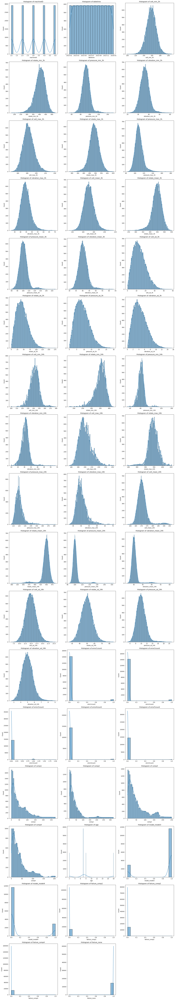

In [55]:
# Veri setindeki özelliklerin listesi
features = data_encoded.columns.tolist()

# Histogramları çizdireceğimiz subplot düzeni
num_plots = len(features)
num_cols = 3
num_rows = (num_plots + num_cols - 1) // num_cols  # Eğer sütun sayısı geçilirse satır sayısı 1 artırılır

plt.figure(figsize=(18, 6*num_rows))

# Her bir özellik için histogramları çizdirme
for i, feature in enumerate(features):
    plt.subplot(num_rows, num_cols, i+1)
    sns.histplot(data_encoded[feature], kde=True)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

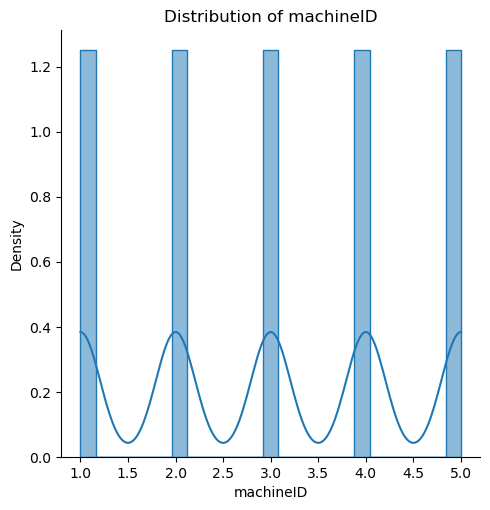

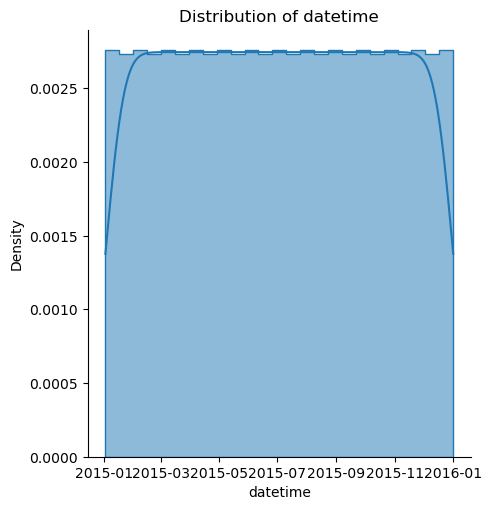

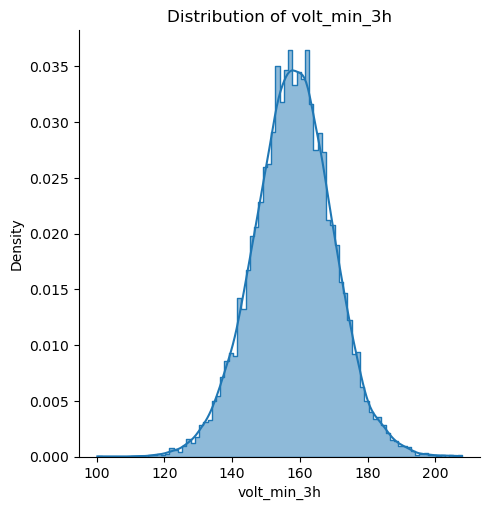

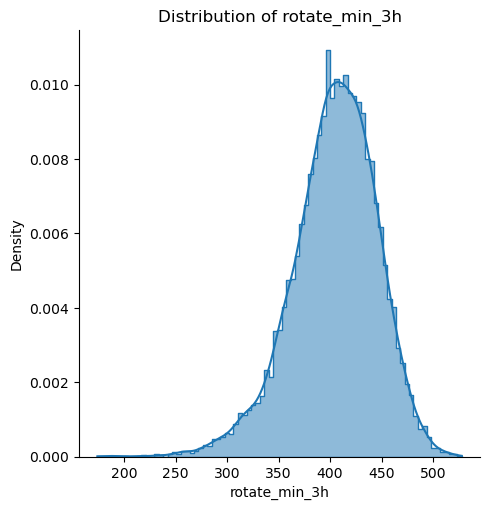

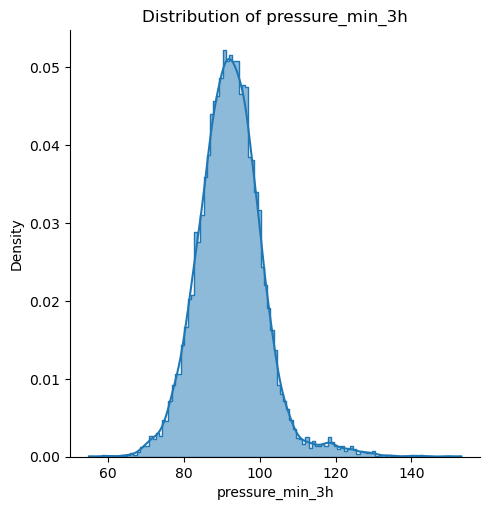

...

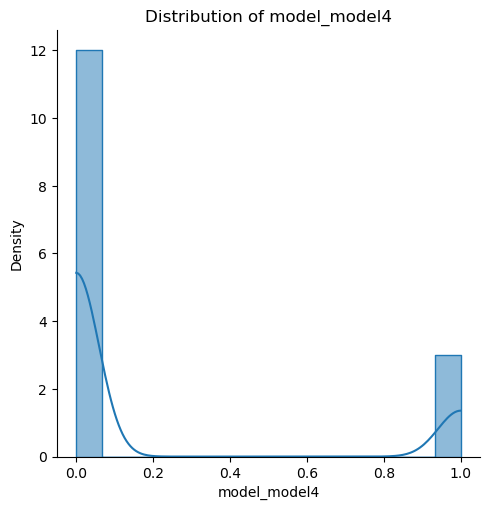

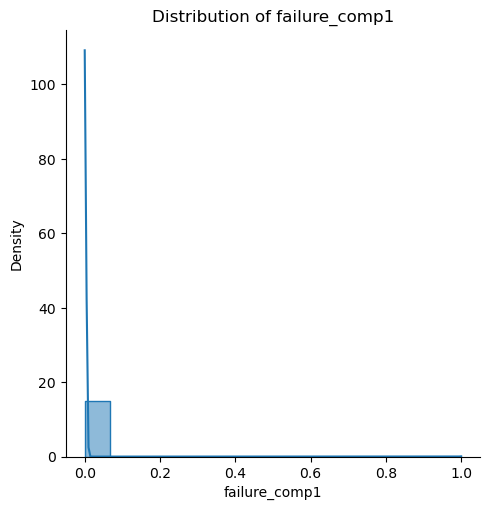

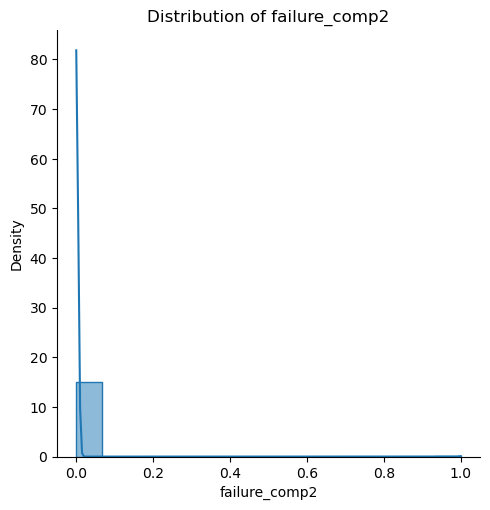

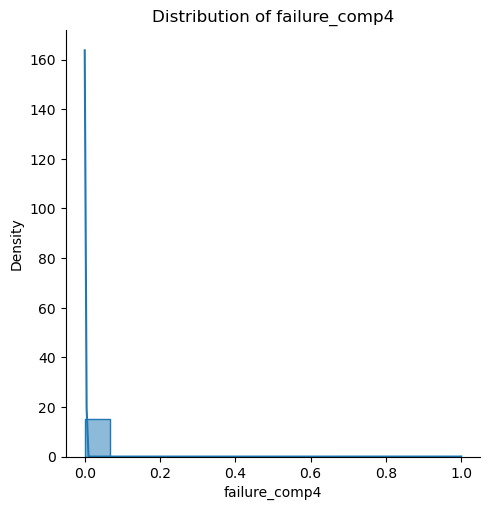

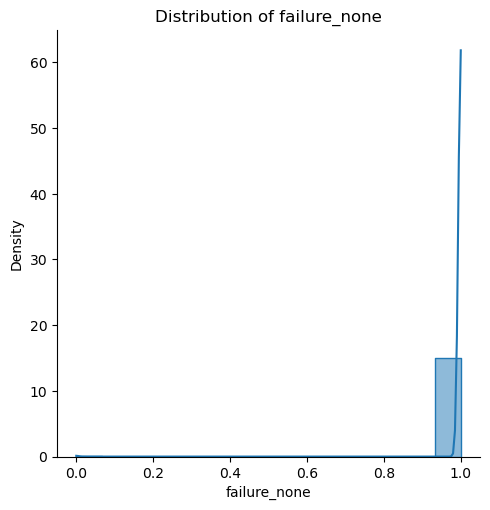

In [64]:
#alternative

for column in data_encoded.columns:
    sns.displot(data_encoded[column], kde=True, rug=False, stat="auto", element="step")
    plt.title(f'Distribution of {column}')
    plt.show()

In [20]:
data_encoded.describe()

,machineID,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,volt_mean_3h,...,comp2,comp3,comp4,age,model_model3,model_model4,failure_comp1,failure_comp2,failure_comp4,failure_none
count,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,...,14565.000000,14565.000000,14565.000000,14565.0000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000,14565.000000
mean,3.000000,158.095898,404.230226,92.288367,36.154721,183.457478,488.673317,109.120101,44.648465,170.791066,...,51.760316,55.606866,37.564641,8.4000,0.800000,0.200000,0.000618,0.001099,0.000275,0.998078
std,1.414262,11.757104,41.174235,8.709859,4.161236,11.922301,41.190763,8.660506,4.185507,9.447236,...,69.110588,55.987581,36.922499,5.2385,0.400014,0.400014,0.024851,0.033127,0.016570,0.043805
min,1.000000,100.194137,174.126968,54.914013,19.955458,145.796526,277.604530,83.428118,31.951825,134.379553,...,0.000000,0.000000,0.000000,2.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,150.421374,380.017465,86.831913,33.441003,175.406755,463.190490,103.514298,41.855076,164.482806,...,10.750000,14.125000,11.375000,7.0000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,3.000000,158.172635,407.030921,92.038229,36.105594,182.714345,488.581985,108.323756,44.301710,170.390373,...,26.500000,34.875000,26.000000,7.0000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,4.000000,165.846218,432.592581,97.165059,38.674146,190.783256,515.138959,113.770131,47.027093,176.593247,...,57.250000,77.875000,49.625000,8.0000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,5.000000,207.826203,527.830931,153.187090,61.426953,241.516461,652.936808,182.111770,70.365920,216.634112,...,322.875000,249.875000,204.875000,18.0000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [42]:
# Merkezi eğilim ölçümleri 
mean_values = data_encoded.mean()  # Tüm özelliklerin ortalaması
median_values = data_encoded.median()  # Tüm özelliklerin medyanı

# Yayılma ölçümleri
std_deviation = data_encoded.std()  # Tüm özelliklerin standart sapması
iqr = data_encoded.quantile(0.75) - data_encoded.quantile(0.25)  # Tüm özelliklerin çeyrekler arası yayılması

print("Ortalama Değerler:")
print(mean_values)
print("\nMedyan Değerler:")
print(median_values)
print("\nStandart Sapma Değerleri:")
print(std_deviation)
print("\nÇeyrekler Arası Yayılma (IQR) Değerleri:")
print(iqr)

Ortalama Değerler:
machineID               3.000000
volt_min_3h           158.095898
rotate_min_3h         404.230226
pressure_min_3h        92.288367
vibration_min_3h       36.154721
volt_max_3h           183.457478
rotate_max_3h         488.673317
pressure_max_3h       109.120101
vibration_max_3h       44.648465
volt_mean_3h          170.791066
rotate_mean_3h        446.435963
pressure_mean_3h      100.703766
vibration_mean_3h      40.394423
volt_sd_3h             13.266036
rotate_sd_3h           44.185334
pressure_sd_3h          8.820158
vibration_sd_3h         4.449466
volt_min_24h          141.495989
rotate_min_24h        348.689023
pressure_min_24h       81.035722
vibration_min_24h      30.584621
volt_max_24h          200.387773
rotate_max_24h        544.797447
pressure_max_24h      120.274171
vibration_max_24h      50.264248
volt_mean_24h         170.794435
rotate_mean_24h       446.447196
pressure_mean_24h     100.688119
vibration_mean_24h     40.396213
volt_sd_24h            1

C:\Users\kerim\AppData\Local\Temp\ipykernel_19788\1353239402.py:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  mean_values = data_encoded.mean()  # Tüm özelliklerin ortalaması
C:\Users\kerim\AppData\Local\Temp\ipykernel_19788\1353239402.py:3: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  median_values = data_encoded.median()  # Tüm özelliklerin medyanı
C:\Users\kerim\AppData\Local\Temp\ipykernel_19788\1353239402.py:7: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  iqr = data_encoded.quantile(0.75) - data_encoded.quantile(0.25)  # Tüm özelliklerin çeyrekler arası yayılması


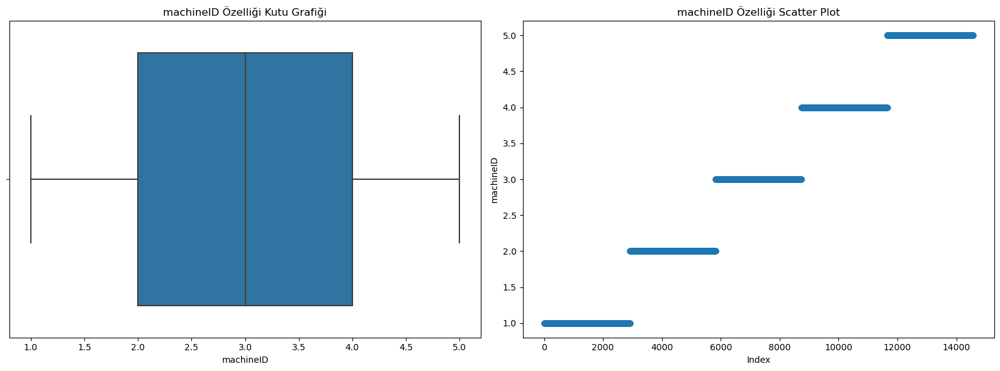

datetime sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.


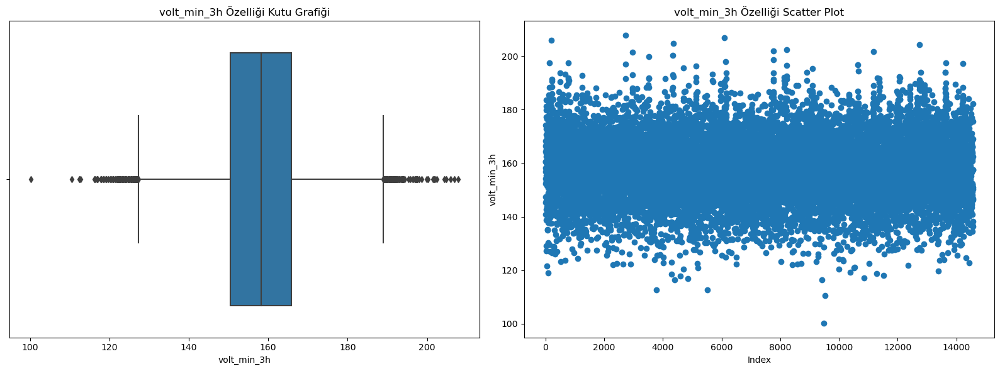

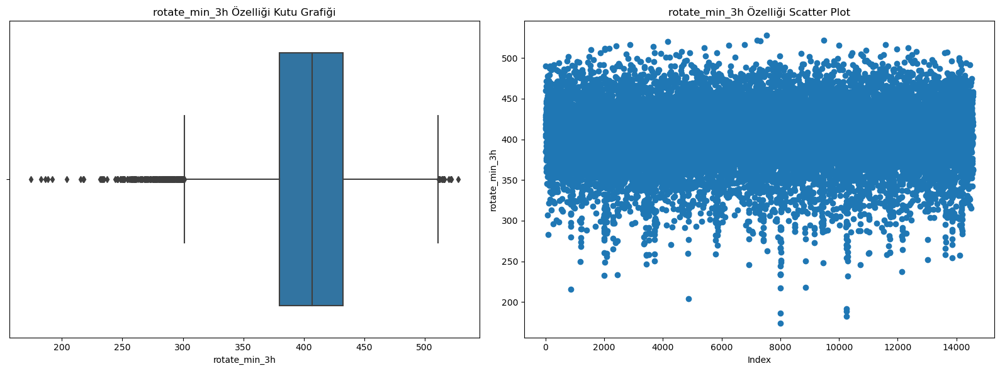

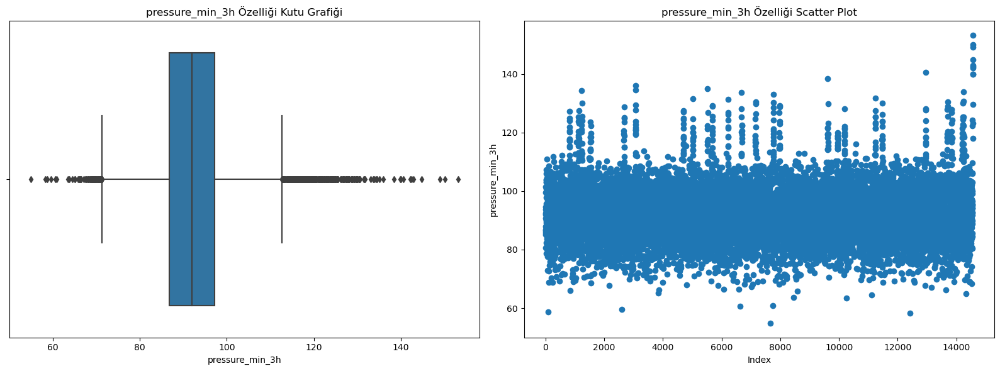

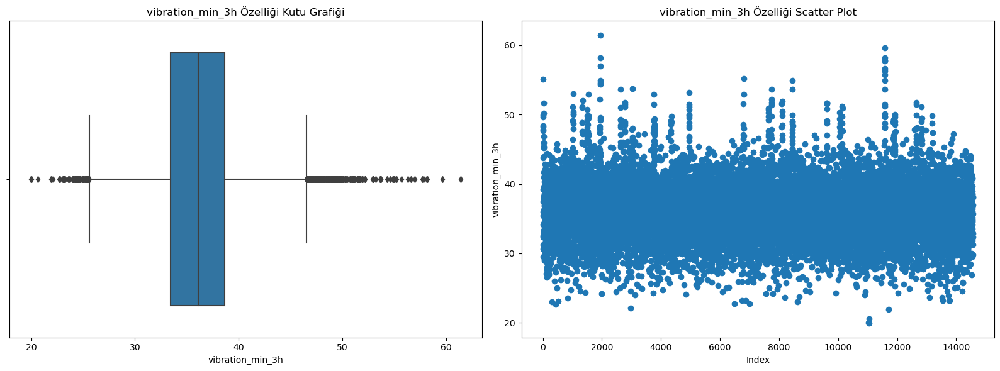

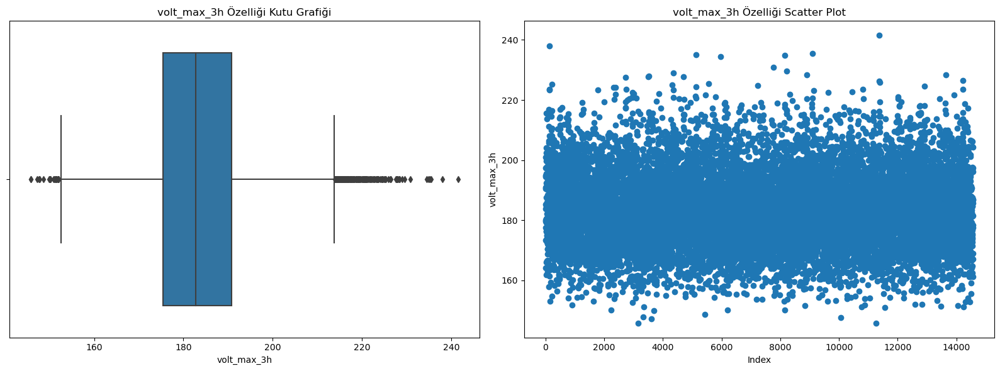

...

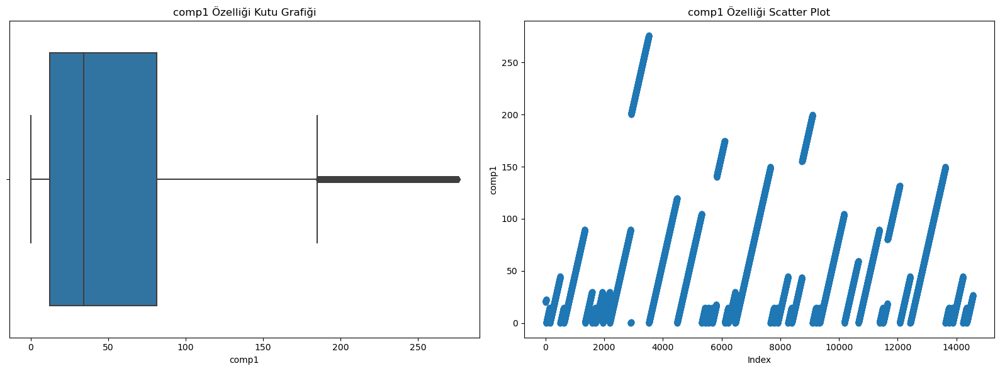

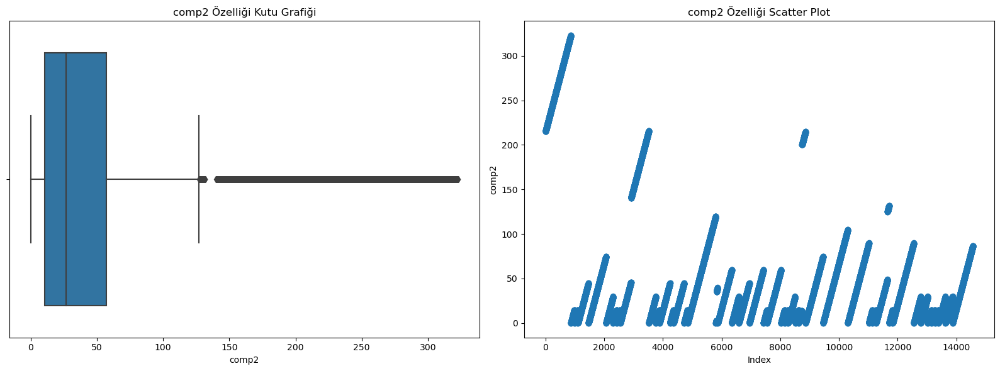

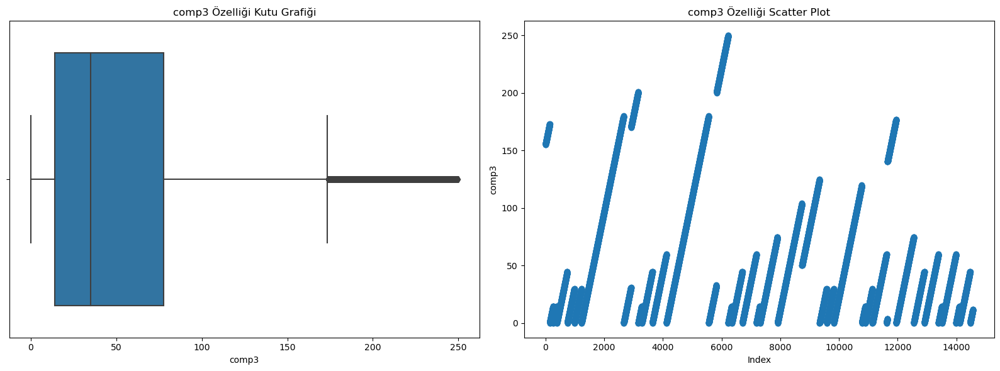

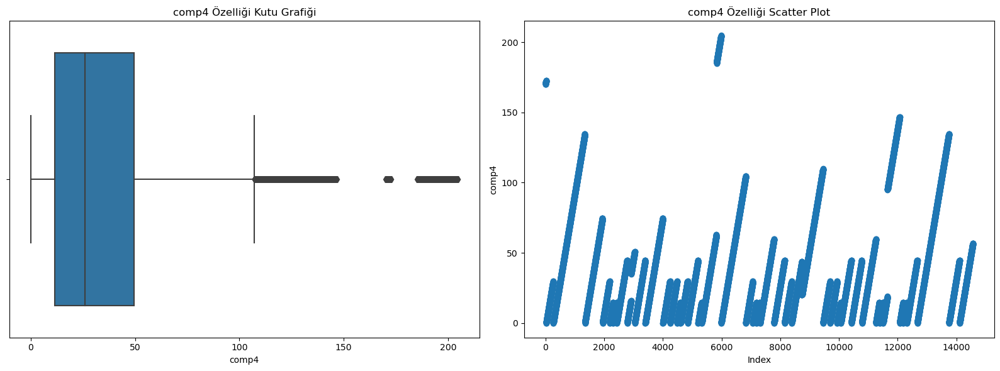

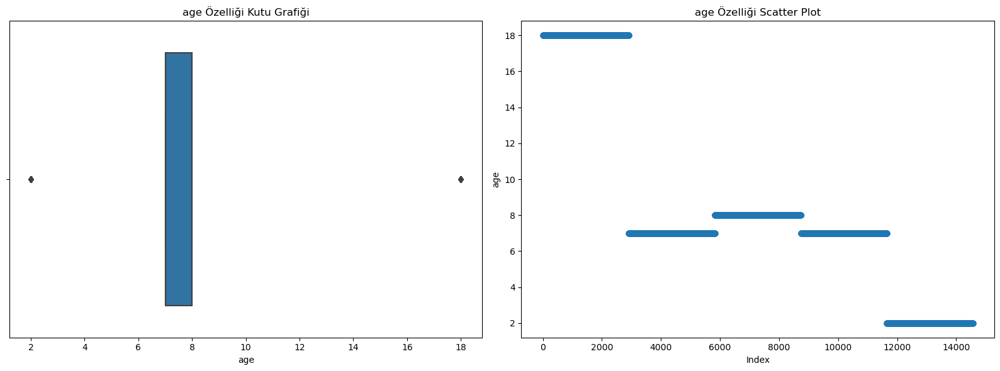

model_model3 sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.
model_model4 sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.
failure_comp1 sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.
failure_comp2 sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.
failure_comp4 sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.
failure_none sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.


In [23]:
# Box Plot - Scatter
for column in data_encoded.columns:
    if data_encoded[column].dtype in ['int64', 'float64']:  # Sayısal veri türleri için grafik çizdirme
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # Yan yana iki grafik oluşturma
        
        # Box plot
        sns.boxplot(x=data_encoded[column], ax=axes[0])
        axes[0].set_title(f'{column} Özelliği Kutu Grafiği')
        axes[0].set_xlabel(column)
        
        # Scatter plot
        axes[1].scatter(range(len(data_encoded[column])), data_encoded[column])
        axes[1].set_title(f'{column} Özelliği Scatter Plot')
        axes[1].set_xlabel('Index')
        axes[1].set_ylabel(column)
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"{column} sütunu için grafik çizdirilemedi, çünkü veri türü uygun değil.")

<Figure size 1200x800 with 0 Axes>

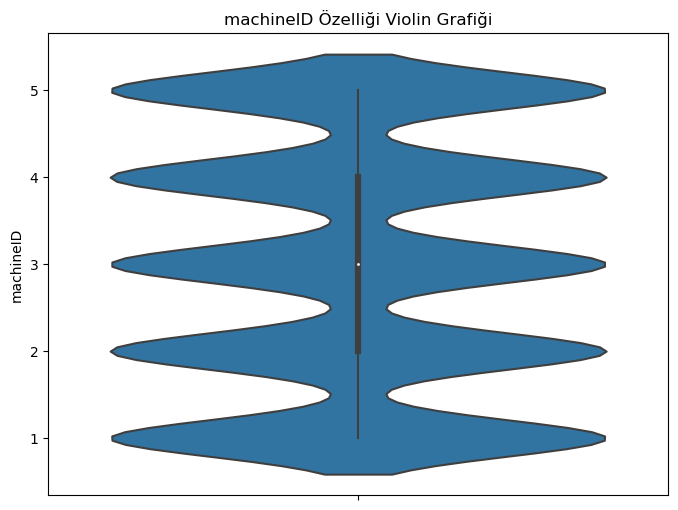

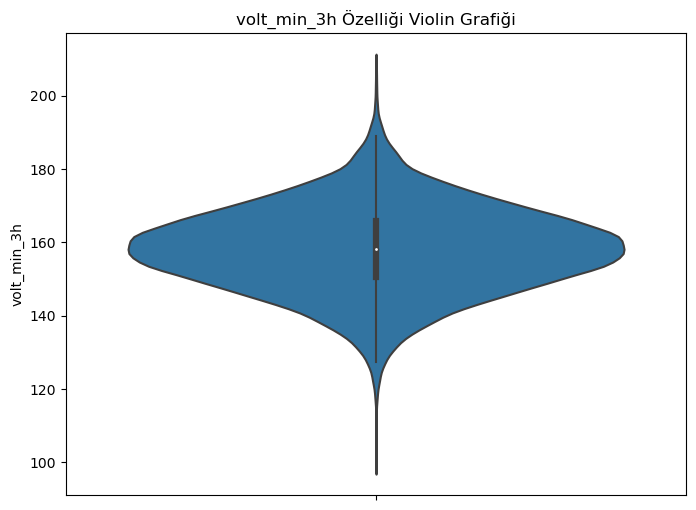

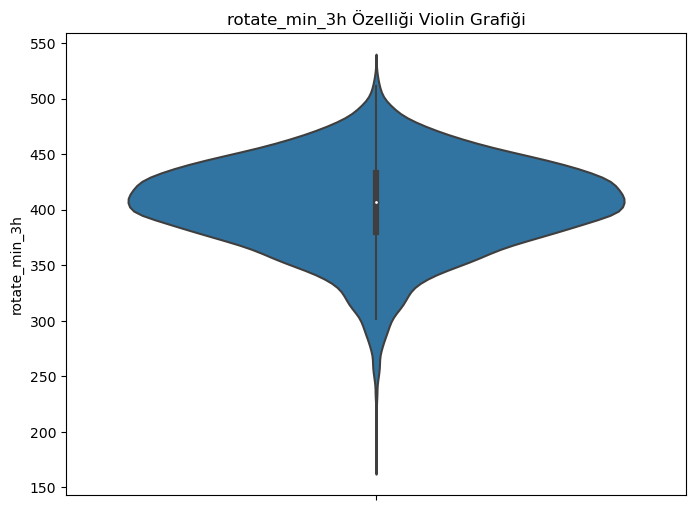

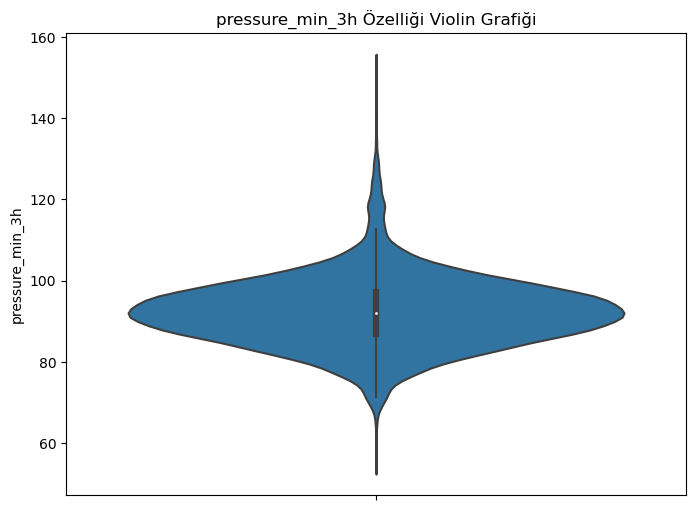

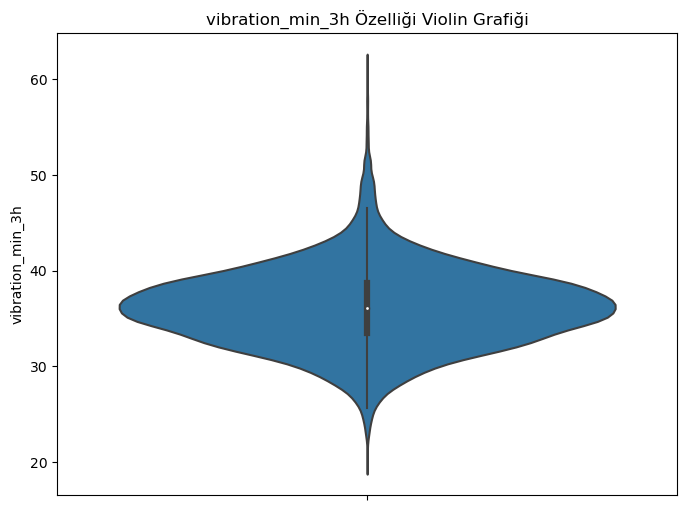

...

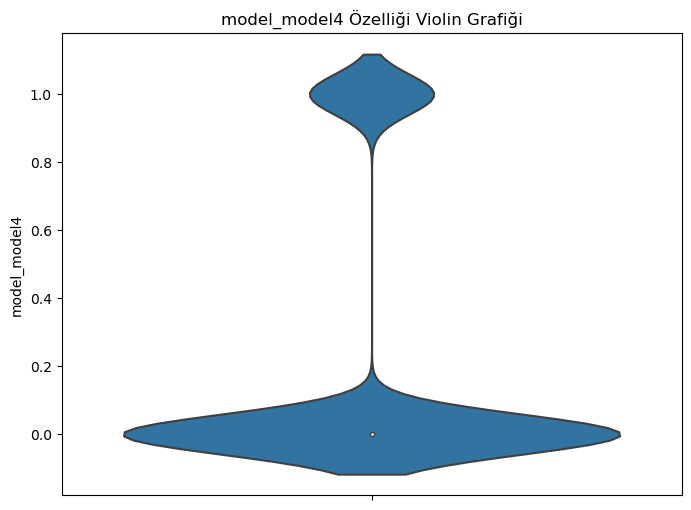

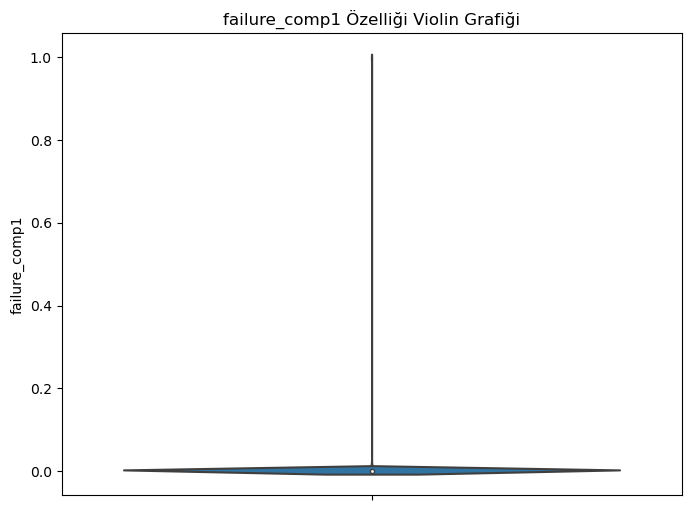

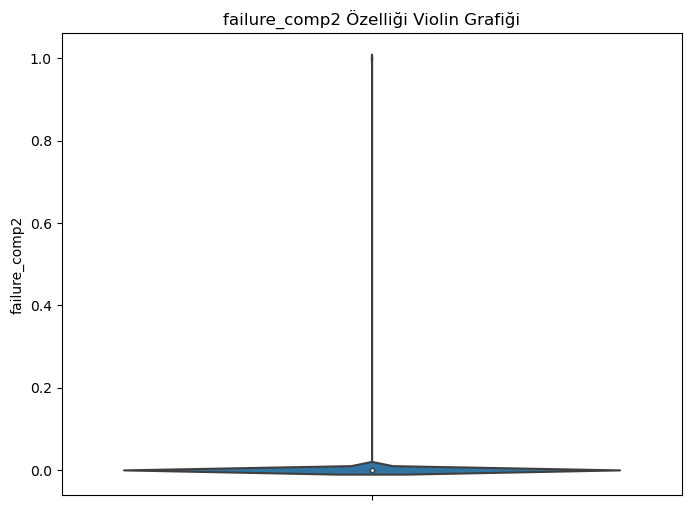

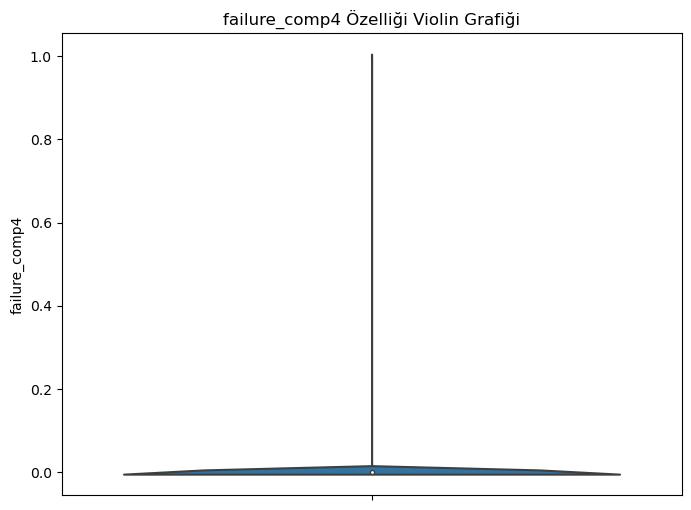

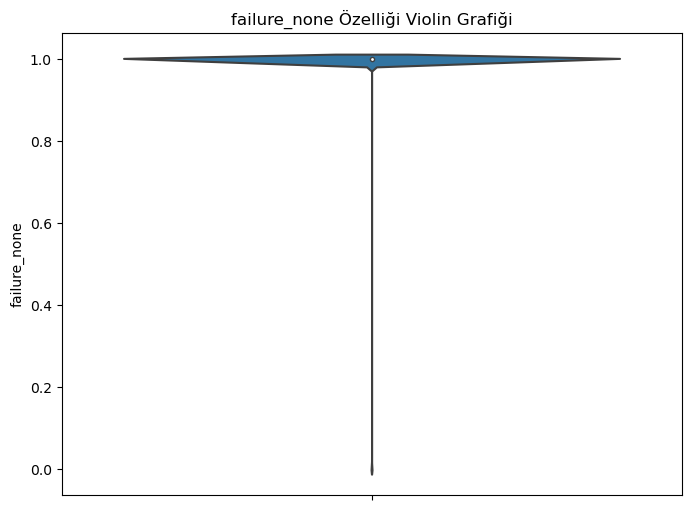

In [24]:
# Violin Plot
numeric_columns = data_encoded.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(12, 8))
for column in numeric_columns:
    plt.figure(figsize=(8, 6))
    sns.violinplot(y=data_encoded[column])
    plt.title(f'{column} Özelliği Violin Grafiği')
    plt.ylabel(column)
    plt.show()

In [25]:
# Aykırı değer sınırları ve sayıları : 
def detect_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

# Veri setinizin sütunlarını döngüye alarak işlem yapma
for column in data_encoded.columns:
    lower_bound, upper_bound = detect_outliers(data_encoded[column])
    outliers = data_encoded[(data_encoded[column] < lower_bound) | (data_encoded[column] > upper_bound)]
    num_outliers = len(outliers)
    print(f"Sütun: {column}")
    print(f"Aykırı Değer Alt Sınırı: {lower_bound}")
    print(f"Aykırı Değer Üst Sınırı: {upper_bound}")
    print(f"Toplam Aykırı Değer Sayısı: {num_outliers}\n")

Sütun: machineID
Aykırı Değer Alt Sınırı: -1.0
Aykırı Değer Üst Sınırı: 7.0
Toplam Aykırı Değer Sayısı: 0

Sütun: datetime
Aykırı Değer Alt Sınırı: 2014-07-04T06:00:00.000000000
Aykırı Değer Üst Sınırı: 2016-07-01T06:00:00.000000000
Toplam Aykırı Değer Sayısı: 0

Sütun: volt_min_3h
Aykırı Değer Alt Sınırı: 127.28410655000002
Aykırı Değer Üst Sınırı: 188.98348535
Toplam Aykırı Değer Sayısı: 171

Sütun: rotate_min_3h
Aykırı Değer Alt Sınırı: 301.1547901
Aykırı Değer Üst Sınırı: 511.45525570000007
Toplam Aykırı Değer Sayısı: 255

Sütun: pressure_min_3h
Aykırı Değer Alt Sınırı: 71.33219351
Aykırı Değer Üst Sınırı: 112.66477847000002
Toplam Aykırı Değer Sayısı: 421

Sütun: vibration_min_3h
Aykırı Değer Alt Sınırı: 25.59128886
Aykırı Değer Üst Sınırı: 46.52385958
Toplam Aykırı Değer Sayısı: 299

Sütun: volt_max_3h
Aykırı Değer Alt Sınırı: 152.34200304999996
Aykırı Değer Üst Sınırı: 213.84800745
Toplam Aykırı Değer Sayısı: 205

Sütun: rotate_max_3h
Aykırı Değer Alt Sınırı: 385.2677851000001
A

# Correlation Matrix

C:\Users\kerim\AppData\Local\Temp\ipykernel_19788\753745724.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data_encoded.corr()
C:\Users\kerim\AppData\Local\Temp\ipykernel_19788\753745724.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  target_correlations = data_encoded.corr()['failure_none'].sort_values(ascending=False)


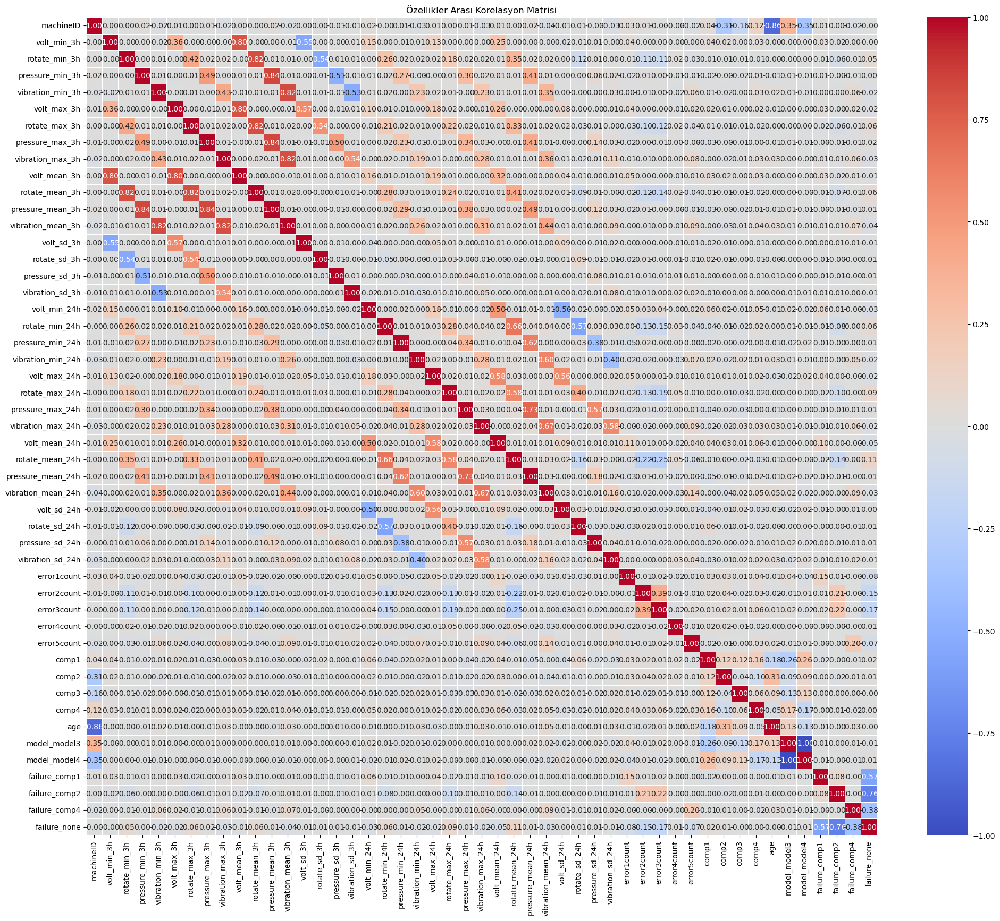

In [56]:
correlation_matrix = data_encoded.corr()

# Hedef değişkenle korelasyon matrisi
target_correlations = data_encoded.corr()['failure_none'].sort_values(ascending=False)

# Heatmap çizdirme (isteğe bağlı)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Özellikler Arası Korelasyon Matrisi')
plt.show()

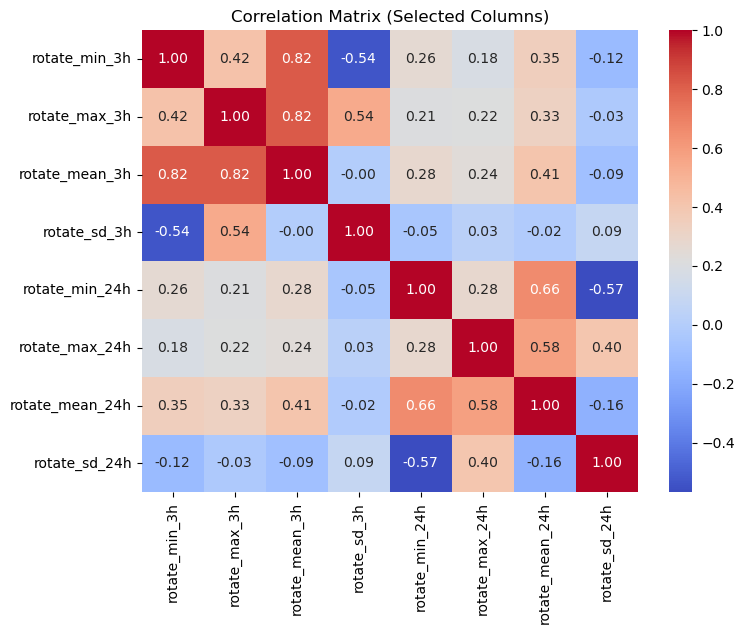

In [40]:
selected_columns = ['rotate_min_3h','rotate_max_3h','rotate_mean_3h','rotate_sd_3h',
                    'rotate_min_24h', 'rotate_max_24h','rotate_mean_24h','rotate_sd_24h'
                   ]
selected_data = data_encoded[selected_columns]

# Korelasyon matrisini hesaplayalım
correlation_matrix = selected_data.corr()

# Korelasyon matrisini görselleştirelim
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix (Selected Columns)')
plt.show()

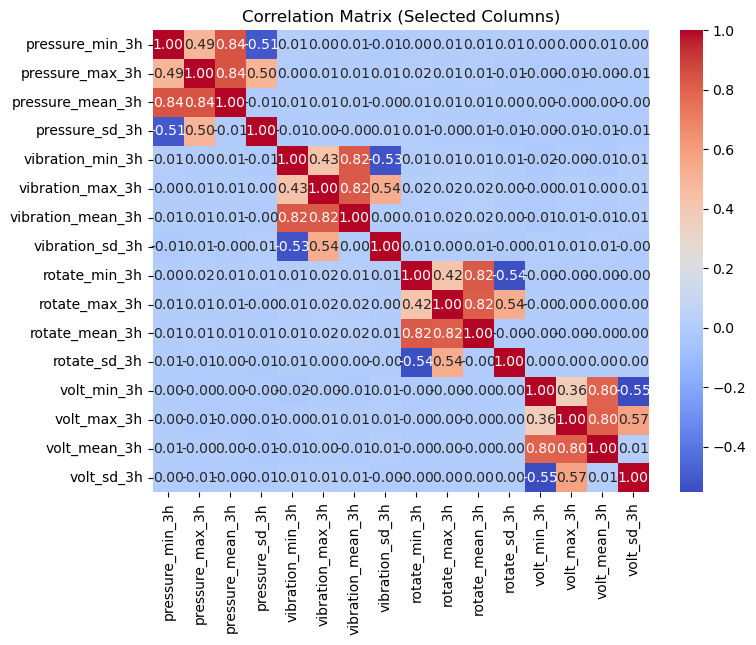

In [51]:
selected_columns = ['pressure_min_3h','pressure_max_3h','pressure_mean_3h','pressure_sd_3h',
                    'vibration_min_3h','vibration_max_3h','vibration_mean_3h','vibration_sd_3h',
                    'rotate_min_3h','rotate_max_3h','rotate_mean_3h','rotate_sd_3h',
                    'volt_min_3h','volt_max_3h','volt_mean_3h','volt_sd_3h'
                   ]
selected_data = data_encoded[selected_columns]

# Korelasyon matrisini hesaplayalım
correlation_matrix = selected_data.corr()

# Korelasyon matrisini görselleştirelim
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix (Selected Columns)')
plt.show()

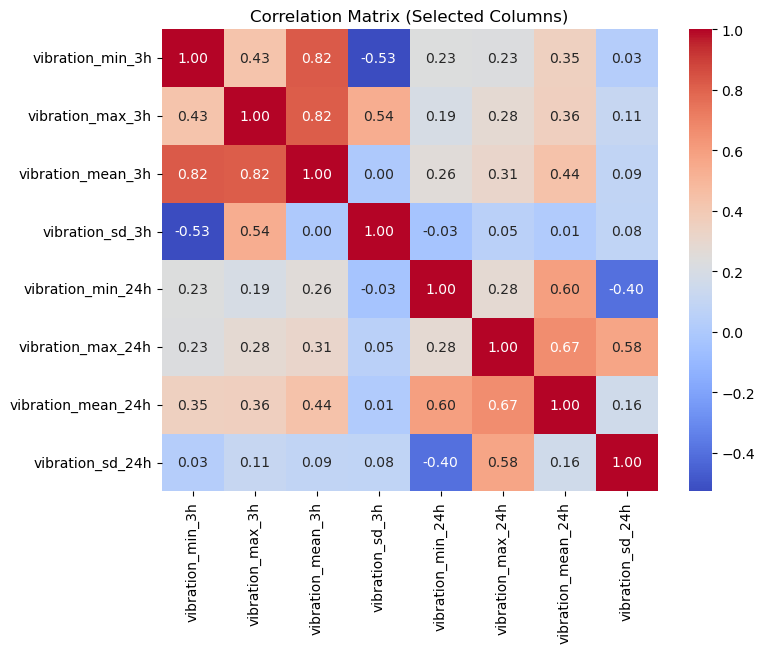

In [52]:
selected_columns = ['vibration_mean_3h','vibration_mean_24h','pressure_mean_3h','pressure_mean_24h','rotate_mean_3h','rotate_mean_24h','volt_mean_3h','volt_mean_24h']
selected_data = data_encoded[selected_columns]

# Korelasyon matrisini hesaplayalım
correlation_matrix = selected_data.corr()

# Korelasyon matrisini görselleştirelim
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix (Selected Columns)')
plt.show()

In [11]:
data_encoded['failure_yes'] = 1 - data_encoded['failure_none']
data_encoded.head()

,machineID,datetime,volt_min_3h,rotate_min_3h,pressure_min_3h,vibration_min_3h,volt_max_3h,rotate_max_3h,pressure_max_3h,vibration_max_3h,...,comp3,comp4,age,model_model3,model_model4,failure_comp1,failure_comp2,failure_comp4,failure_none,failure_yes
0,1,2015-01-02 06:00:00,158.271400,403.235951,92.439132,32.516838,200.872430,495.777958,96.535487,52.355876,...,155.000,170.000,18,1,0,0,0,0,1,0
1,1,2015-01-02 09:00:00,160.528861,384.645962,86.944273,29.527665,197.363124,486.459056,114.342061,42.992509,...,155.125,170.125,18,1,0,0,0,0,1,0
2,1,2015-01-02 12:00:00,147.300678,412.965696,90.711354,34.203042,173.394523,439.579460,110.408985,37.117103,...,155.250,170.250,18,1,0,0,0,0,1,0
3,1,2015-01-02 15:00:00,152.420775,385.354924,99.506819,30.665184,185.205355,497.840620,105.993247,47.862484,...,155.375,170.375,18,1,0,0,0,0,1,0
4,1,2015-01-02 18:00:00,145.248486,424.542633,93.743827,37.422272,180.030715,495.376449,111.950587,43.099758,...,155.500,170.500,18,1,0,0,0,0,1,0


In [12]:
data_encoded.to_csv('data_encoded.csv', index=False)

In [ ]:
data_encoded.to_csv('data.csv', index=False)